# Assignment 6 - 3D Graphics Systems - IMPA 2021

## Deform a source mesh to form a target mesh using 3D loss functions

## 0. Install and Import modules

Ensure `torch` and `torchvision` are installed. If `pytorch3d` is not installed, install it using the following cell:

In [1]:
from google.colab import drive
drive.mount('/content/drive')

import sys
sys.path.append('/content/drive/MyDrive/s3d21')

Mounted at /content/drive


In [2]:
import os
import sys
import torch
need_pytorch3d=False
try:
    import pytorch3d
except ModuleNotFoundError:
    need_pytorch3d=True
if need_pytorch3d:
    if torch.__version__.startswith("1.7") and sys.platform.startswith("linux"):
        # We try to install PyTorch3D via a released wheel.
        version_str="".join([
            f"py3{sys.version_info.minor}_cu",
            torch.version.cuda.replace(".",""),
            f"_pyt{torch.__version__[0:5:2]}"
        ])
        !pip install pytorch3d -f https://dl.fbaipublicfiles.com/pytorch3d/packaging/wheels/{version_str}/download.html
    else:
        # We try to install PyTorch3D from source.
        !curl -LO https://github.com/NVIDIA/cub/archive/1.10.0.tar.gz
        !tar xzf 1.10.0.tar.gz
        os.environ["CUB_HOME"] = os.getcwd() + "/cub-1.10.0"
        !pip install 'git+https://github.com/facebookresearch/pytorch3d.git@stable'

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   118  100   118    0     0    592      0 --:--:-- --:--:-- --:--:--   592
100  404k    0  404k    0     0   487k      0 --:--:-- --:--:-- --:--:-- 1910k
  Cloning https://github.com/facebookresearch/pytorch3d.git (to revision stable) to /tmp/pip-req-build-7oqw2cok
  Running command git clone -q https://github.com/facebookresearch/pytorch3d.git /tmp/pip-req-build-7oqw2cok
  Running command git checkout -q 3c15a6c2469249c8b90a4f3e41e34350b8051b92
     |████████████████████████████████| 51kB 4.9MB/s 
     |████████████████████████████████| 645kB 17.0MB/s 
  Created wheel for pytorch3d: filename=pytorch3d-0.4.0-cp37-cp37m-linux_x86_64.whl size=23227061 sha256=e10ea9c50a08741771db89f793f6bdde6186e5f005f5506a657bf471b0bf374f
  Stored in directory: /tmp/pip-ephem-wheel-cache-tat5j8q3/wheels/89/69/08/d864f516508b5d943259c6088baa150eb

In [3]:
import os
import torch
from pytorch3d.io import load_obj, save_obj
from pytorch3d.structures import Meshes
from pytorch3d.utils import ico_sphere
from pytorch3d.ops import sample_points_from_meshes
from pytorch3d.loss import (
    chamfer_distance, 
    mesh_edge_loss, 
    mesh_laplacian_smoothing, 
    mesh_normal_consistency,
    point_mesh_edge_distance,
    point_mesh_face_distance,
)
import numpy as np
from tqdm.notebook import tqdm
%matplotlib notebook 
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['savefig.dpi'] = 80
mpl.rcParams['figure.dpi'] = 80

# Set the device
if torch.cuda.is_available():
    device = torch.device("cuda:0")
else:
    device = torch.device("cpu")
    print("WARNING: CPU only, this will be slow!")

## 1. Load an obj file and create a Meshes object

Download the target 3D model of a dolphin. It will be saved locally as a file called `dolphin.obj`.

In [4]:
!wget https://dl.fbaipublicfiles.com/pytorch3d/data/dolphin/dolphin.obj

--2021-06-05 19:56:35--  https://dl.fbaipublicfiles.com/pytorch3d/data/dolphin/dolphin.obj
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 104.22.75.142, 172.67.9.4, 104.22.74.142, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|104.22.75.142|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 156763 (153K) [text/plain]
Saving to: ‘dolphin.obj’

dolphin.obj         100%[===================>] 153.09K  --.-KB/s    in 0.03s   

2021-06-05 19:56:35 (4.89 MB/s) - ‘dolphin.obj’ saved [156763/156763]



In [5]:
# Load the dolphin mesh.
trg_obj = os.path.join('dolphin.obj')

In [6]:
# We read the target 3D model using load_obj
verts, faces, aux = load_obj(trg_obj)

# verts is a FloatTensor of shape (V, 3) where V is the number of vertices in the mesh
# faces is an object which contains the following LongTensors: verts_idx, normals_idx and textures_idx
# For this tutorial, normals and textures are ignored.
faces_idx = faces.verts_idx.to(device)
verts = verts.to(device)

In [7]:
# We initialize the source shape to be a sphere of radius 1
src_mesh = ico_sphere(4, device)

1.1 The source mesh is a sphere of radius 1 centered at (0, 0, 0). To speed up the optimization process, we should scale normalize the target mesh and center it at the origin, making it fit the unit sphere. Do this operations with the `verts`tensor and create a `Meshes` object with the normalized vertices and the faces indices.

1.2 Visualize the source and target meshes using `Plotly` integration.

In [8]:
# 1.1
from mytorchutils import normalizeverts
normalized_verts, center, scale = normalizeverts(verts)
trg_mesh = Meshes(verts=[normalized_verts], faces=[faces_idx])

In [9]:
# 1.2
from pytorch3d.vis.plotly_vis import AxisArgs, plot_batch_individually, plot_scene
from pytorch3d.vis.texture_vis import texturesuv_image_matplotlib
from pytorch3d.ops import sample_points_from_meshes
from pytorch3d.structures import Meshes, join_meshes_as_batch, join_meshes_as_scene, Pointclouds

from mytorchutils import render2meshplotly

render2meshplotly(src_mesh, trg_mesh)

###  Visualizing point clouds with Matplotlib

We can also sample points from the surfaces and visualize them using Matplotlib. It can be a useful to have a coarse estimation of the surface during iterations in the optimization process.

In [10]:
def plot_pointcloud(mesh, title=""):
    # Sample points uniformly from the surface of the mesh.
    points = sample_points_from_meshes(mesh, 5000)
    x, y, z = points.clone().detach().cpu().squeeze().unbind(1)    
    fig = plt.figure(figsize=(5, 5))
    ax = Axes3D(fig)
    ax.scatter3D(x, z, -y)
    ax.set_xlabel('x')
    ax.set_ylabel('z')
    ax.set_zlabel('y')
    ax.set_title(title)
    ax.view_init(190, 30)
    plt.show()

1.3 Use the function `plot_pointcloud` to see the initial pointcloud

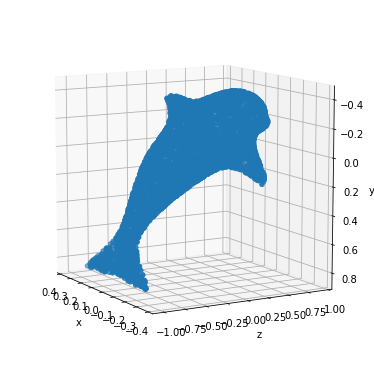

In [11]:
%matplotlib inline
plot_pointcloud(trg_mesh)

## 2. Optimization loop 

Starting from a sphere mesh, we learn the offset to each vertex in the mesh such that the predicted mesh is closer to the target mesh at each optimization step. To achieve this we minimize the distance between the predicted (deformed) and target mesh, defined as the **chamfer distance** between the set of pointclouds resulting from **differentiably sampling points** from their surfaces.

However, solely minimizing the chamfer distance between the predicted and the target mesh will lead to a non-smooth shape. We enforce smoothness by adding **shape regularizers** to the objective. Namely, we add:

+ `mesh_edge_length`, which minimizes the length of the edges in the predicted mesh.
+ `mesh_normal_consistency`, which enforces consistency across the normals of neighboring faces.
+ `mesh_laplacian_smoothing`, which is the laplacian regularizer.
We will learn to deform the source mesh by offsetting its vertices

In [12]:
# The shape of the deform parameters is equal to the total number of vertices in src_mesh
deform_verts = torch.full(src_mesh.verts_packed().shape, 0.0, device=device, requires_grad=True)

In [13]:
# The optimizer
optimizer = torch.optim.SGD([deform_verts], lr=1.0, momentum=0.9)

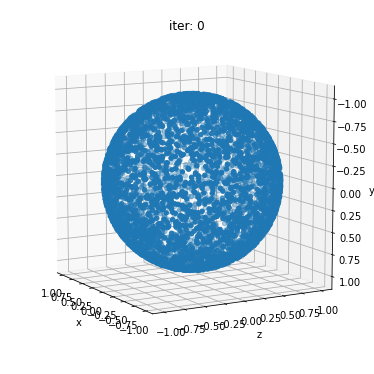

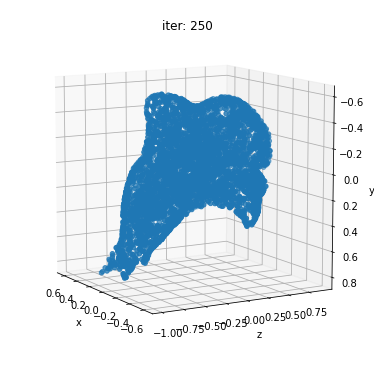

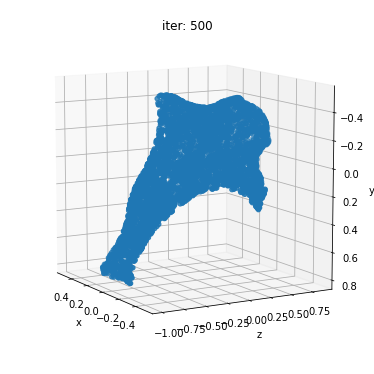

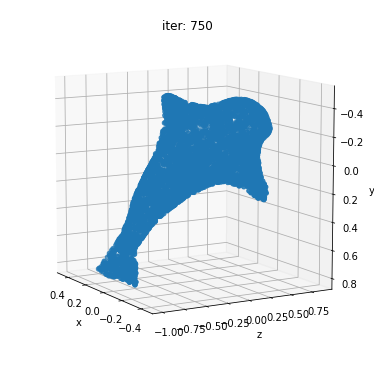

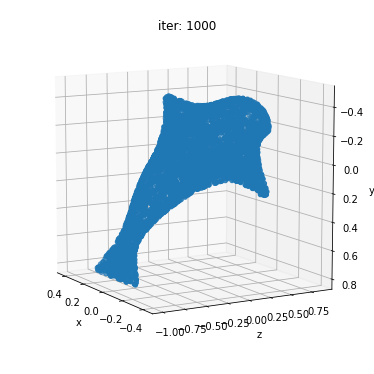

...

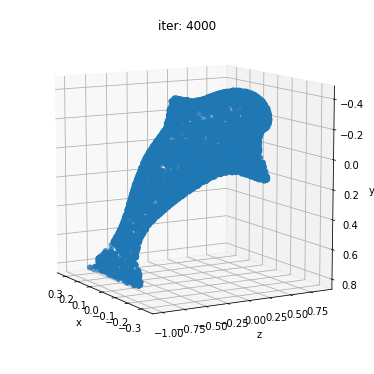

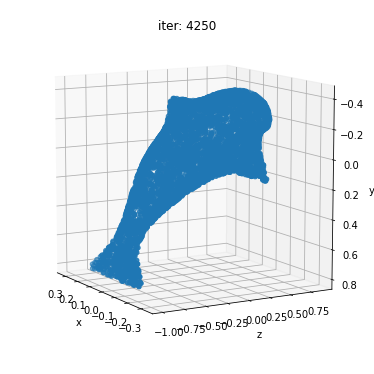

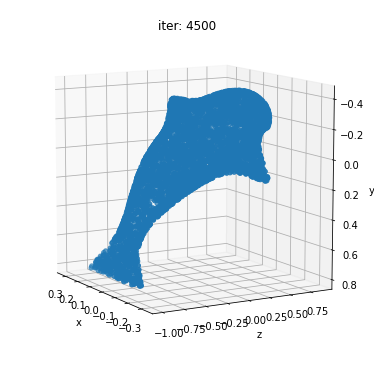

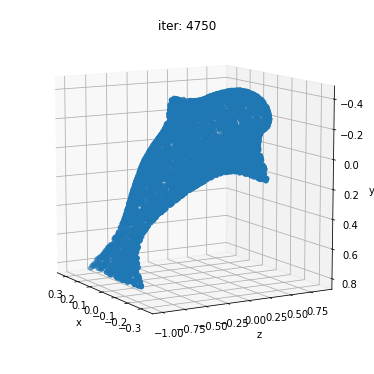

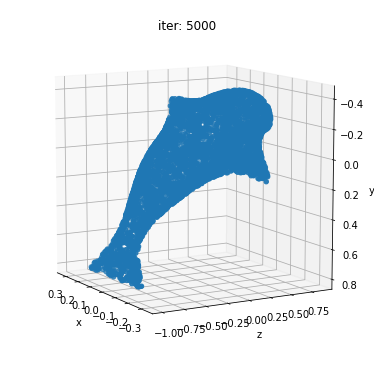

In [14]:
# Number of optimization steps
Niter = 5000
# Weight for the chamfer loss
w_chamfer = 1.0 
# Weight for mesh edge loss
w_edge = 1.0 
# Weight for mesh normal consistency
w_normal = 0.01 
# Weight for mesh laplacian smoothing
w_laplacian = 0.1 
# Plot period for the losses
plot_period = 250
loop = tqdm(range(Niter))

chamfer_losses = []
laplacian_losses = []
edge_losses = []
normal_losses = []

%matplotlib inline

for i in loop:
    # Initialize optimizer
    optimizer.zero_grad()
    
    # Deform the mesh
    new_src_mesh = src_mesh.offset_verts(deform_verts)
    
    # We sample 5k points from the surface of each mesh 
    sample_trg = sample_points_from_meshes(trg_mesh, 5000)
    sample_src = sample_points_from_meshes(new_src_mesh, 5000)
    
    # We compare the two sets of pointclouds by computing (a) the chamfer loss
    loss_chamfer, _ = chamfer_distance(sample_trg, sample_src)
    
    # and (b) the edge length of the predicted mesh
    loss_edge = mesh_edge_loss(new_src_mesh)
    
    # mesh normal consistency
    loss_normal = mesh_normal_consistency(new_src_mesh)
    
    # mesh laplacian smoothing
    loss_laplacian = mesh_laplacian_smoothing(new_src_mesh, method="uniform")
    
    # Weighted sum of the losses
    loss = loss_chamfer * w_chamfer + loss_edge * w_edge + loss_normal * w_normal + loss_laplacian * w_laplacian
    
    # Print the losses
    loop.set_description('total_loss = %.6f' % loss)
    
    # Save the losses for plotting
    chamfer_losses.append(loss_chamfer)
    edge_losses.append(loss_edge)
    normal_losses.append(loss_normal)
    laplacian_losses.append(loss_laplacian)
    
    # Plot mesh after each `plot_period` iterations
    if i % plot_period == 0:
        plot_pointcloud(new_src_mesh, title="iter: %d" % i)
    
    if i == Niter - 1:
        plot_pointcloud(new_src_mesh, title="iter: %d" % Niter)

    # Optimization step
    loss.backward()
    optimizer.step()


## Visualize the loss

In [15]:
def plot_losses(loss_dict, size=(13,5)):
  fig = plt.figure(figsize=size)
  ax = fig.gca()
  for loss_name, loss_values in loss_dict.items():
    ax.plot(loss_values, label=loss_name)
  ax.legend(fontsize="16")
  ax.set_xlabel("Iteration", fontsize="16")
  ax.set_ylabel("Loss", fontsize="16")
  ax.set_title("Loss vs iterations", fontsize="16");

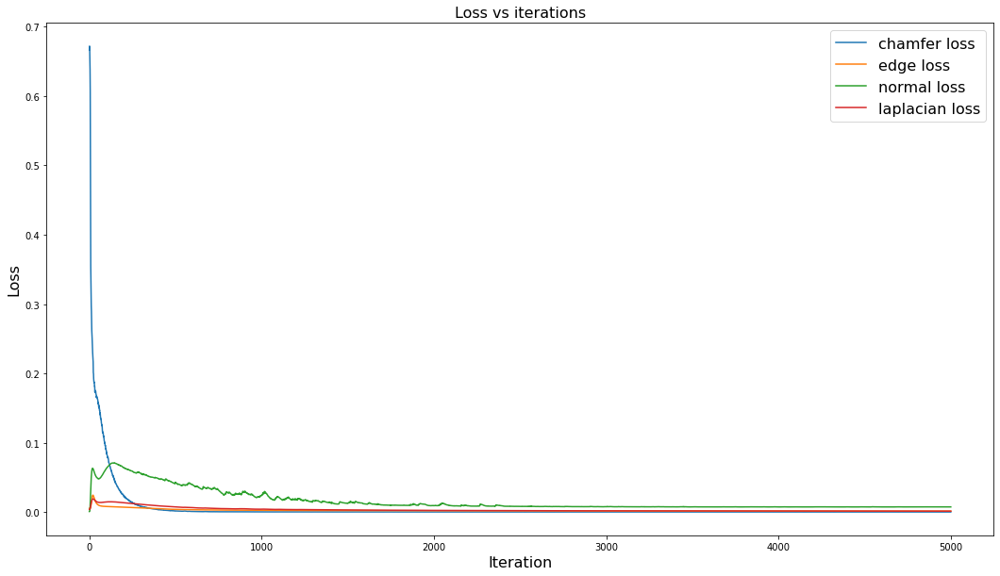

In [16]:
losses = {"chamfer loss": chamfer_losses, 
          "edge loss": edge_losses,
          "normal loss": normal_losses,
          "laplacian loss": laplacian_losses}
plot_losses(losses, (18, 10))

## Save the predicted mesh

In [17]:
# Fetch the verts and faces of the final predicted mesh
final_verts, final_faces = new_src_mesh.get_mesh_verts_faces(0)

2.1 Scale normalize back the `final_verts` to the original target size



In [18]:
#2.1
final_verts = final_verts * scale
final_verts = final_verts + center

In [19]:
# Store the predicted mesh using save_obj
final_obj = os.path.join('./', 'dolphin_predicted_2_1.obj')
save_obj(final_obj, final_verts, final_faces)

2.2 Visualize the target mesh and the final mesh using `Plotly`. Qualitatively, what do you think of the result?

2.3 Take a look at the **Loss vs Iteration** graph, paying attention to how the losses are decreasing. Do you think it would be possible to achieve a reasonable result with less iterations? Is it worth to run with more iterations? Explain you thoughts, then run the optimization loop again making the changes to validate your hypothesis.

2.4 The loss function used for this task is a linear combination of four losses. Let `w_chamfer = 1.0` and set the other coefficients to zero. Run the  optimization loop again with this configuration and describe the result. 

**[EXTRA] E.1 Experiment other coefficients configurations and describe the results.**

2.5 Experiment with others optimizers such as `Adam` and `RMSprop` in place of `SGD`. Also, try changing the learning rate (`lr`), and `momentum` when these parameters are applied. What do you observe in terms of speed of convergence and quality of final results?




In [20]:
#2.2
from mytorchutils import render2meshplotly
render2meshplotly(new_src_mesh, trg_mesh)

In [30]:
def deform_src_mesh_to_target(src_mesh, trg_mesh, weights = None, iterations = None, optimizer_option = None,  lr = 1.0, momentum = 0.9):

  if weights == None:
    weights = {
      "w_chamfer"   : 1.00, 
      "w_edge"      : 1.00,
      "w_normal"    : 0.01, 
      "w_laplacian" : 0.10,
      "w_mesh_edge" : 0.00,
      "w_mesh_face" : 0.00
    }
  
  if not ("w_mesh_edge") in weights:
    weights["w_mesh_edge"] = 0.0

  if not ("w_mesh_face") in weights:
    weights["w_mesh_face"] = 0.0

  if iterations == None:
    iterations = 5000

  if optimizer_option == None:
    optimizer_option = 1

  # The shape of the deform parameters is equal to the total number of vertices in src_mesh
  deform_verts = torch.full(src_mesh.verts_packed().shape, 0.0, device=device, requires_grad=True)

  # The optimizer
  # SGD
  if optimizer_option == 1:
    print("optimizer SGD")
    optimizer = torch.optim.SGD([deform_verts], lr=lr, momentum=momentum)
  elif optimizer_option == 2:
    print("optimizer Adam")
    optimizer = torch.optim.Adam([deform_verts], lr=lr)
  elif optimizer_option == 3:
    print("optimizer RMSprop")
    optimizer = torch.optim.RMSprop([deform_verts], lr=lr)

  # Number of optimization steps
  Niter = iterations
  # Weight for the chamfer loss
  w_chamfer = weights["w_chamfer"]
  # Weight for mesh edge loss
  w_edge = weights["w_edge"]
  # Weight for mesh normal consistency
  w_normal = weights["w_normal"]
  # Weight for mesh laplacian smoothing
  w_laplacian = weights["w_laplacian"]
  
  w_mesh_edge = weights["w_mesh_edge"]
  w_mesh_face = weights["w_mesh_face"]

  # Plot period for the losses
  plot_period = 250
  loop = tqdm(range(Niter))

  chamfer_losses = []
  laplacian_losses = []
  edge_losses = []
  normal_losses = []

  %matplotlib inline

  for i in loop:
      # Initialize optimizer
      optimizer.zero_grad()
      
      # Deform the mesh
      new_src_mesh = src_mesh.offset_verts(deform_verts)
      
      #TODO: add more points per mesh
      # We sample 5k points from the surface of each mesh 
      sample_trg = sample_points_from_meshes(trg_mesh, 5000)
      sample_src = sample_points_from_meshes(new_src_mesh, 5000)
      
      # We compare the two sets of pointclouds by computing (a) the chamfer loss
      loss_chamfer, _ = chamfer_distance(sample_trg, sample_src)
      #pytorch3d.loss.chamfer_distance(x, y, x_lengths=None, y_lengths= batch_reduction: Optional[str] = 'mean', point_reduction: str = 'mean')[source]
      
      # and (b) the edge length of the predicted mesh
      loss_edge = mesh_edge_loss(new_src_mesh)
      #pytorch3d.loss.mesh_edge_loss
      
      # mesh normal consistency
      loss_normal = mesh_normal_consistency(new_src_mesh)
      #pytorch3d.loss.mesh_normal_consistency(meshes)[source]
      
      # mesh laplacian smoothing
      loss_laplacian = mesh_laplacian_smoothing(new_src_mesh, method="uniform")
      #pytorch3d.loss.mesh_laplacian_smoothing(meshes, method: str = 'uniform')[source]
      
      loss_mesh_edge = 0#point_mesh_edge_distance(new_src_mesh, sample_trg)
      #pytorch3d.loss.point_mesh_edge_distance(meshes: pytorch3d.structures.meshes.Meshes, pcls: pytorch3d.structures.pointclouds.Pointclouds)[source]
      
      loss_mesh_face = 0#point_mesh_face_distance(new_src_mesh, sample_trg)
      #pytorch3d.loss.point_mesh_face_distance(meshes: pytorch3d.structures.meshes.Meshes, pcls: pytorch3d.structures.pointclouds.Pointclouds)[source]

      # Weighted sum of the losses
      loss = loss_chamfer * w_chamfer + loss_edge * w_edge +  loss_normal * w_normal + loss_laplacian * w_laplacian + loss_mesh_edge * w_mesh_edge + loss_mesh_face * w_mesh_face
      
      # Print the losses
      loop.set_description('total_loss = %.6f' % loss)
      
      # Save the losses for plotting
      chamfer_losses.append(loss_chamfer)
      edge_losses.append(loss_edge)
      normal_losses.append(loss_normal)
      laplacian_losses.append(loss_laplacian)
      
      # Plot mesh after each `plot_period` iterations
      if i % plot_period == 0:
          plot_pointcloud(new_src_mesh, title="iter: %d" % i)
      if i == Niter - 1:
          plot_pointcloud(new_src_mesh, title="iter: %d" % Niter)

      # Optimization step
      loss.backward()
      optimizer.step()

  return  { "chamfer_losses"   : chamfer_losses,
            "laplacian_losses" : laplacian_losses,
            "edge_losses"      : edge_losses, 
            "normal_losses"    : normal_losses,
            "new_mesh"         : new_src_mesh } 

def SaveObjMesh(mesh, center, scale, obj_name):
  final_verts, final_faces = mesh.get_mesh_verts_faces(0)

  final_verts = final_verts * scale
  final_verts = final_verts + center
  
  final_obj = os.path.join('./', obj_name+'.obj')
  save_obj(final_obj, final_verts, final_faces)


weights = {
  "w_chamfer"   : 1.00, 
  "w_edge"      : 1.00,
  "w_normal"    : 0.01, 
  "w_laplacian" : 0.10,
  "w_mesh_edge" : 0.00,
  "w_mesh_face" : 0.00
}
#ret = deform_src_mesh_to_target(src_mesh, trg_mesh, weights, 5000, 1)

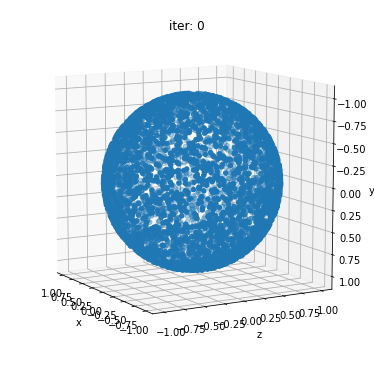

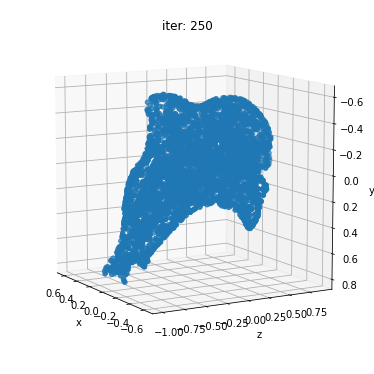

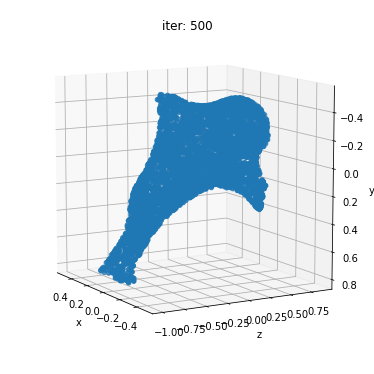

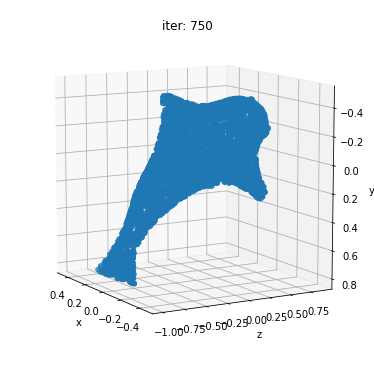

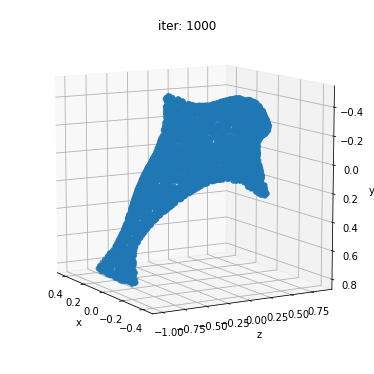

...

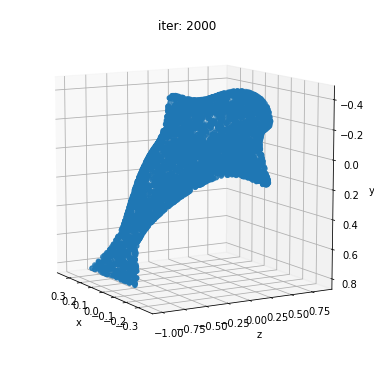

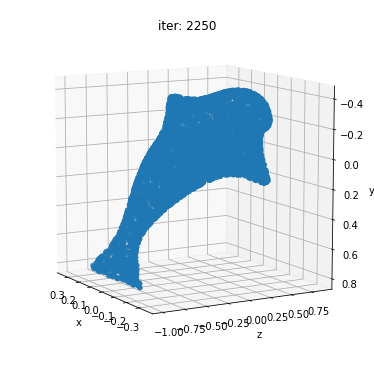

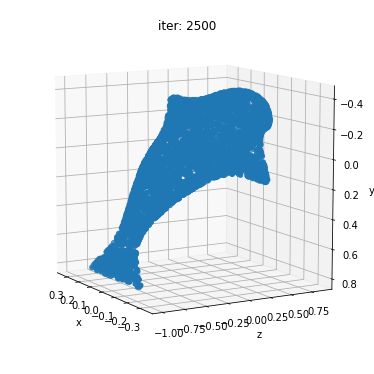

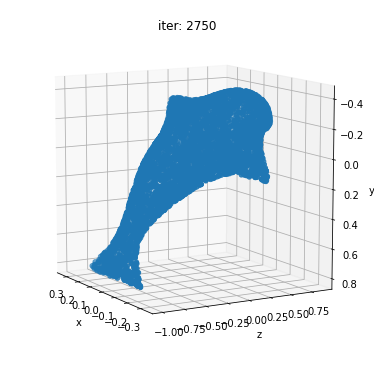

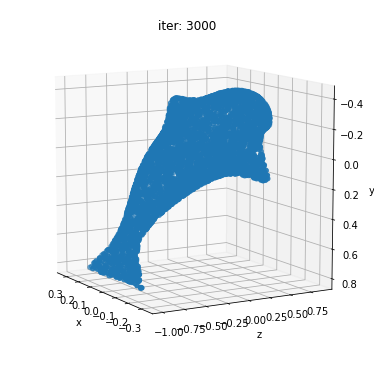

In [23]:
#2.3
# provavelmente é possível rodar menos iterações e obter um melhor resultado, pq a normal
#   loss acaba removendo as mudanças bruscas que ocorrem nas normais nas extremidades da malha.
# Nesse caso, é importante que tenha um certo loss nas normais pelas extremidades aparentes
#   na malha, definidas nas barbatanas do dolphin.

weights = {
  "w_chamfer"   : 1.00, 
  "w_edge"      : 1.00,
  "w_normal"    : 0.01, 
  "w_laplacian" : 0.10
}
#TODO: Testar com 3000?
ret = deform_src_mesh_to_target(src_mesh, trg_mesh, weights, 3000, 1)
SaveObjMesh(ret["new_mesh"], center, scale, "dolphin_predicted_2_3")

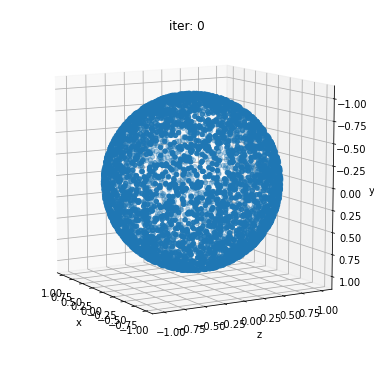

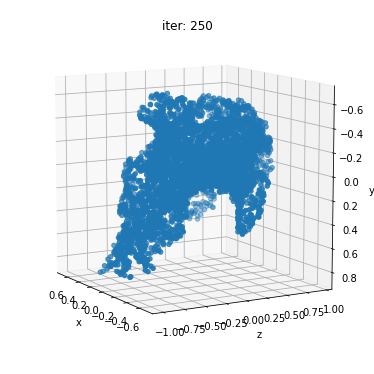

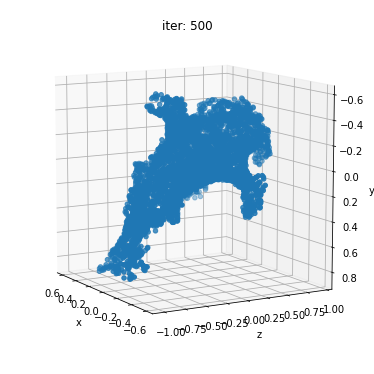

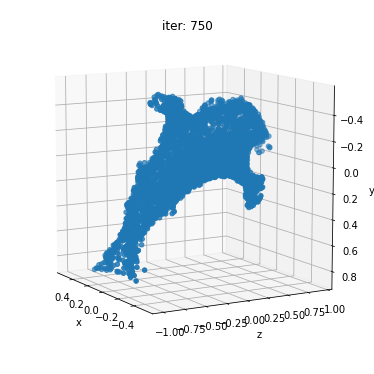

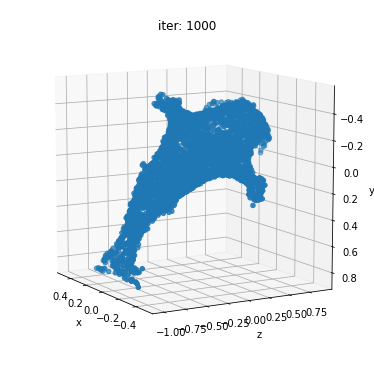

...

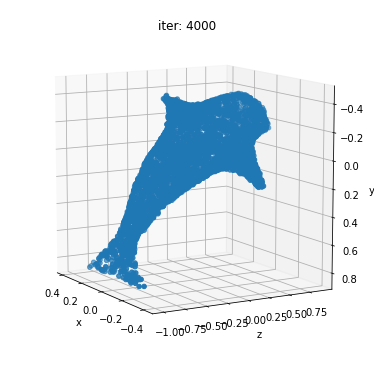

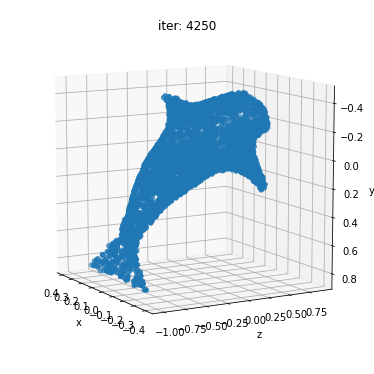

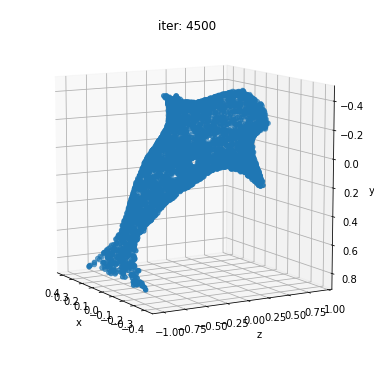

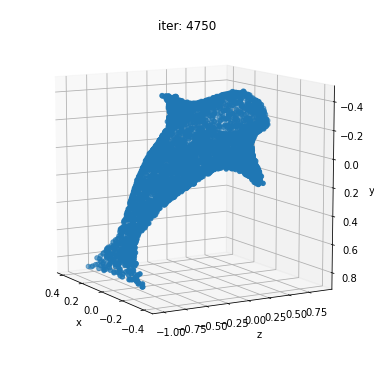

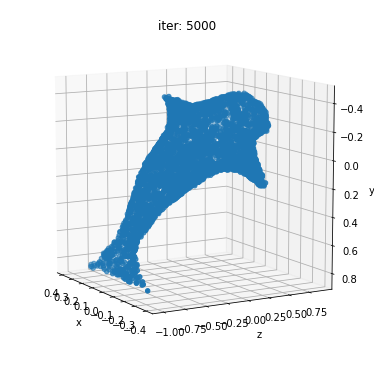

In [24]:
# 2.4
# Como usa a distancia de chamfer, os pontos acabam convergindo para os pontos mais próximos, e acaba levando mais iterações para chegar em um resultado.
# Além disso, como não mantém as arestas entre os vértices, a malha acaba perdendo sua coerência, e a malha fica toda bagunçada.
# o Fato de não ter a compensação das arestas faz com que as faces não sejam preservadas. 
weights = {
  "w_chamfer"   : 1.00, 
  "w_edge"      : 0.00,
  "w_normal"    : 0.00, 
  "w_laplacian" : 0.00
}
ret = deform_src_mesh_to_target(src_mesh, trg_mesh, weights, 5000, 1)
SaveObjMesh(ret["new_mesh"], center, scale, "dolphin_predicted_2_4")

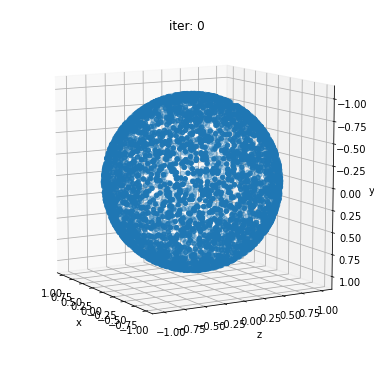

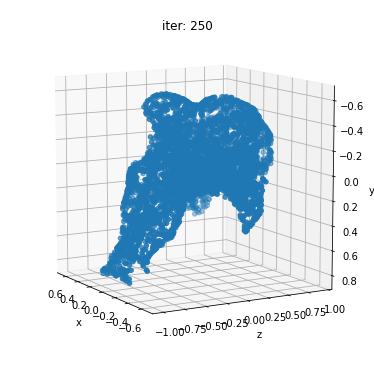

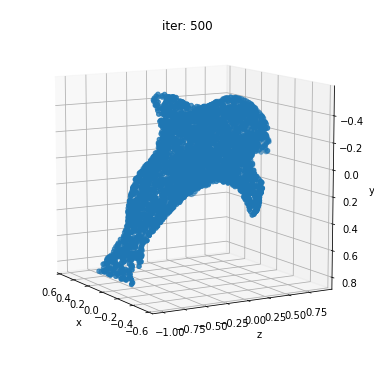

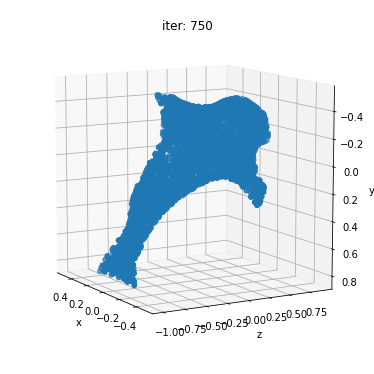

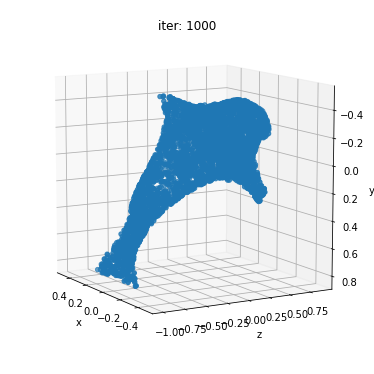

...

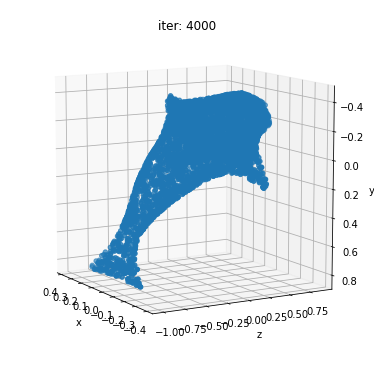

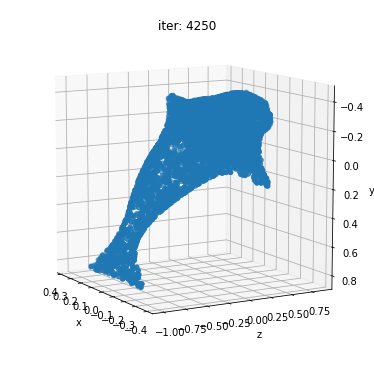

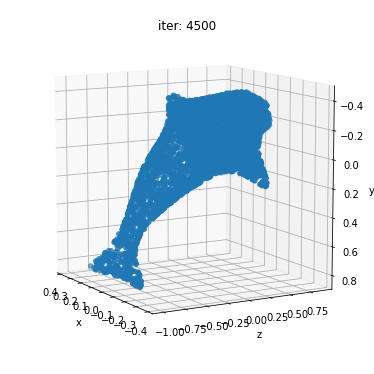

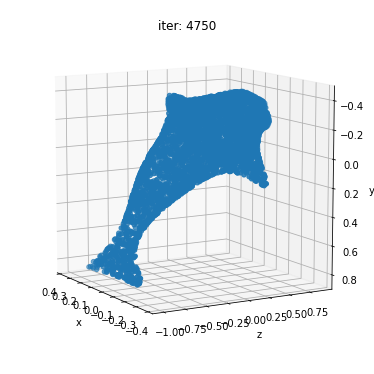

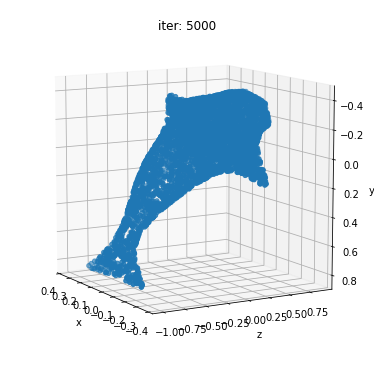

In [26]:
# [EXTRA] E.1 Experiment other coefficients configurations and describe the results.
weights_1 = {
  "w_chamfer"   : 1.00, 
  "w_edge"      : 1.00,
  "w_normal"    : 0.50, 
  "w_laplacian" : 0.10
}
weights_2 = {
  "w_chamfer"   : 1.00, 
  "w_edge"      : 0.10,
  "w_normal"    : 0.01, 
  "w_laplacian" : 0.10
}
ico_src_mesh = ico_sphere(4, device)
ret = deform_src_mesh_to_target(ico_src_mesh, trg_mesh, weights_2, 5000, 1)
SaveObjMesh(ret["new_mesh"], center, scale, "dolphin_predicted_e_1_w2")

optimizer Adam


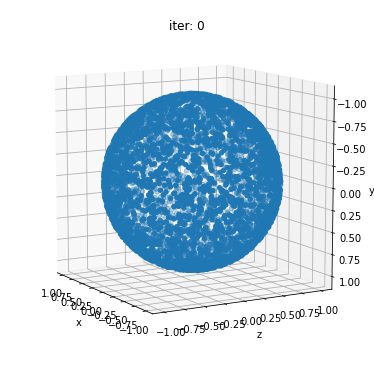

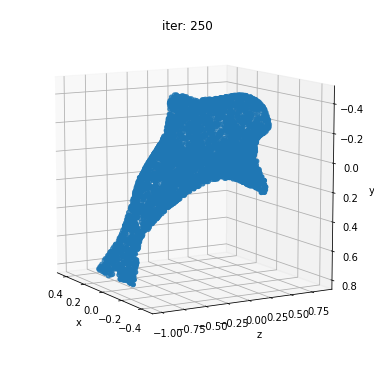

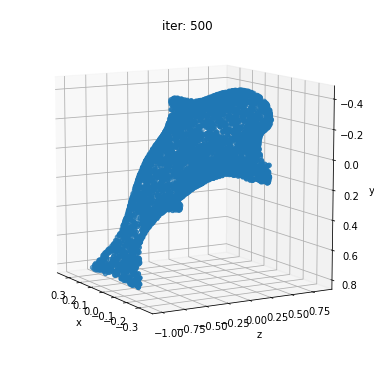

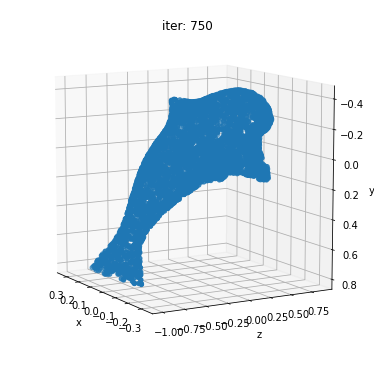

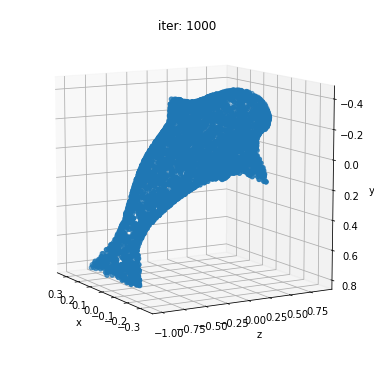

...

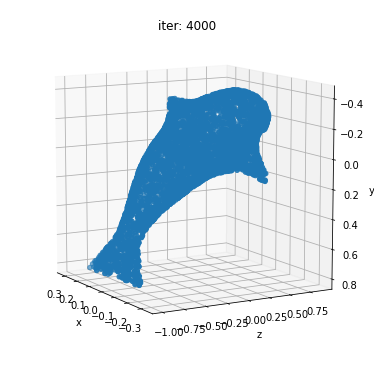

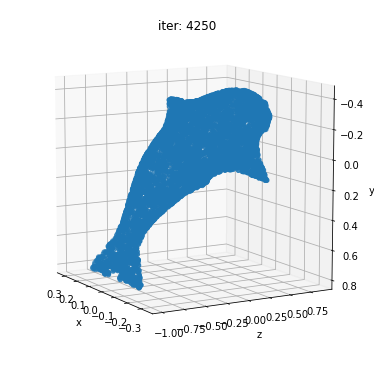

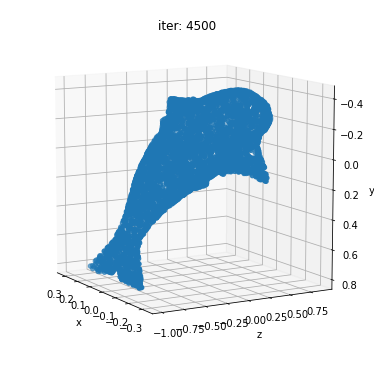

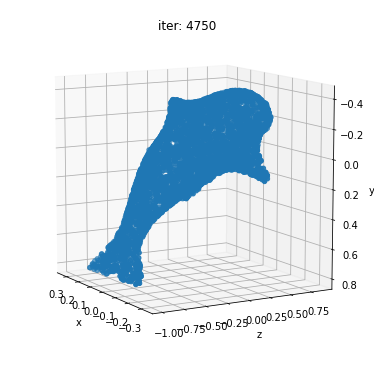

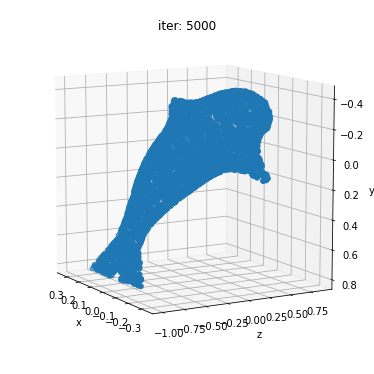

In [31]:
# 2.5
# Experiment with others optimizers such as Adam and RMSprop in place of SGD.
# Also, try changing the learning rate (lr), and momentum when these parameters are applied. 
# What do you observe in terms of speed of convergence and quality of final results?
weights = {
  "w_chamfer"   : 1.00, 
  "w_edge"      : 1.00,
  "w_normal"    : 0.01, 
  "w_laplacian" : 0.10
}
#Adam demora mais, mas parece ter um resultado bom
ico_src_mesh = ico_sphere(4, device)
ret = deform_src_mesh_to_target(ico_src_mesh, trg_mesh, weights, 5000, 2, 0.01)
SaveObjMesh(ret["new_mesh"], center, scale, "dolphin_predicted_2_5_adam")

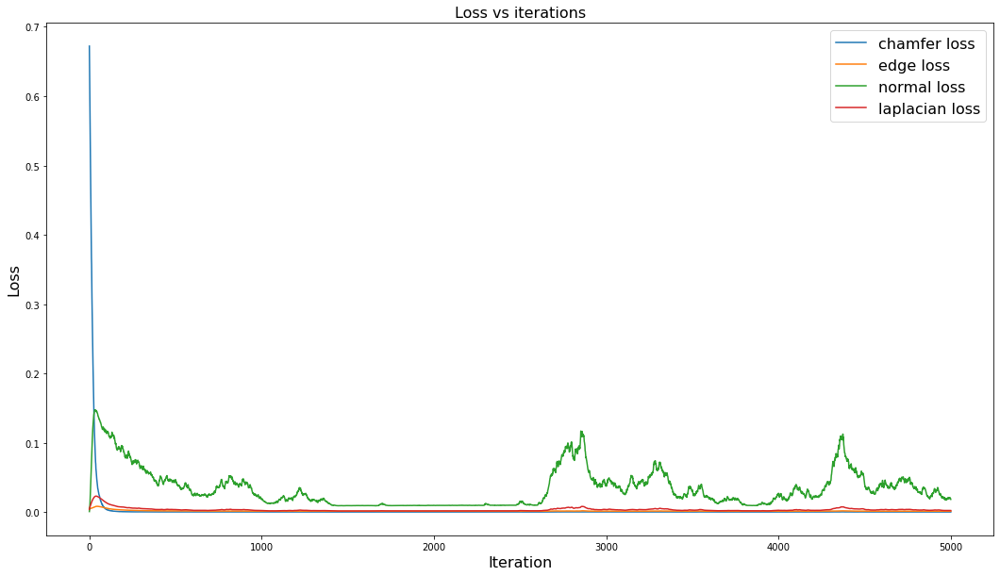

In [32]:
losses = {"chamfer loss": ret["chamfer_losses"], 
          "edge loss": ret["edge_losses"],
          "normal loss": ret["normal_losses"],
          "laplacian loss": ret["laplacian_losses"]}
plot_losses(losses, (18, 10))

optimizer RMSprop


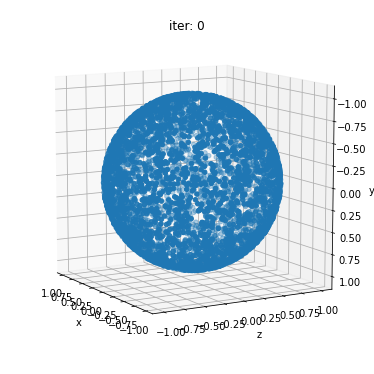

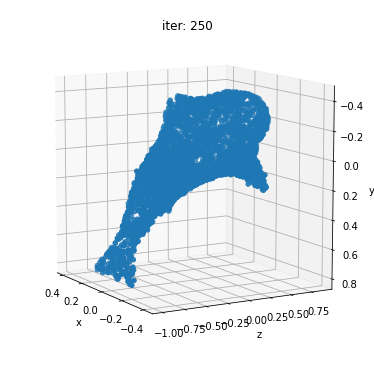

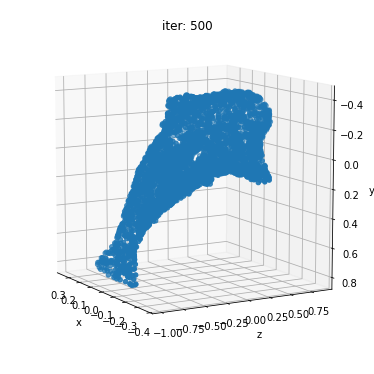

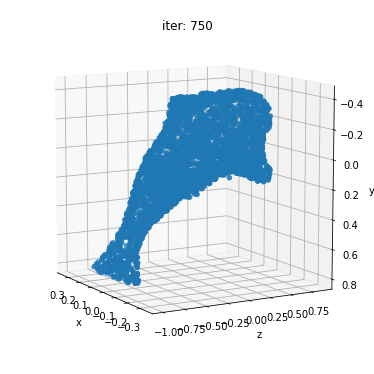

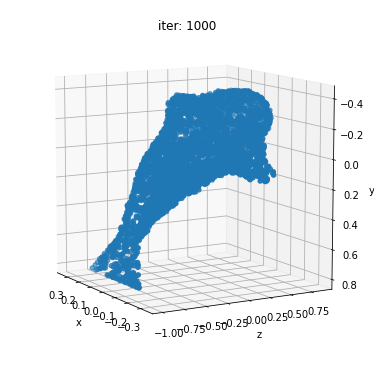

...

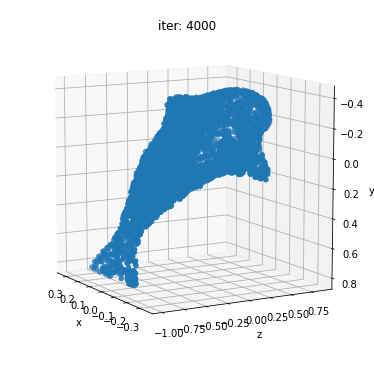

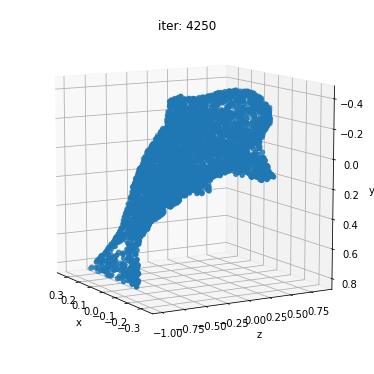

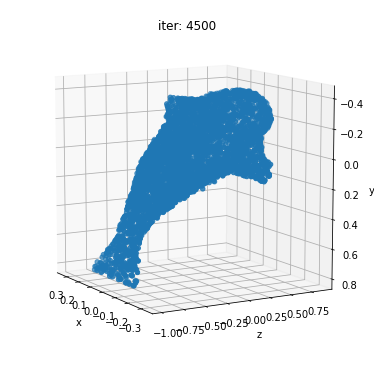

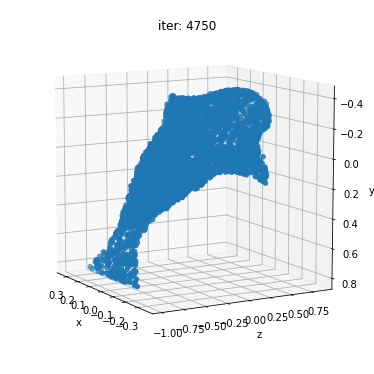

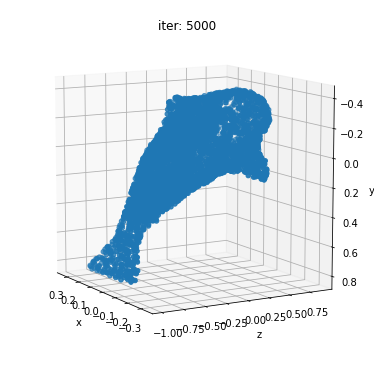

In [33]:
# 2.5 Continued RMSProp
weights = {
  "w_chamfer"   : 1.00, 
  "w_edge"      : 1.00,
  "w_normal"    : 0.01, 
  "w_laplacian" : 0.10
}
#Adam demora mais, mas parece ter um resultado bom
ico_src_mesh = ico_sphere(4, device)
ret = deform_src_mesh_to_target(ico_src_mesh, trg_mesh, weights, 5000, 3, 0.01)
SaveObjMesh(ret["new_mesh"], center, scale, "dolphin_predicted_2_5_rmsprop")

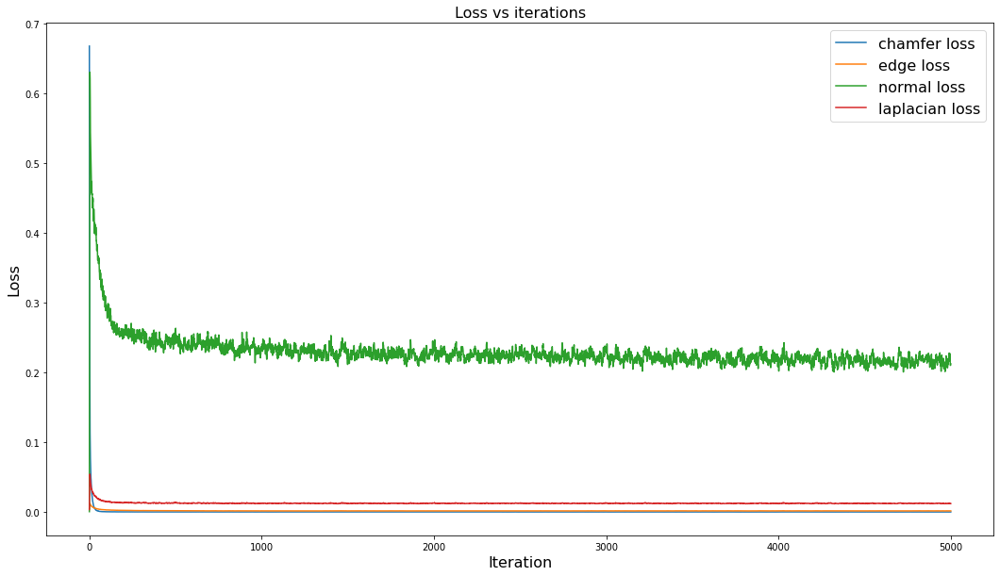

In [34]:
losses = {"chamfer loss": ret["chamfer_losses"], 
          "edge loss": ret["edge_losses"],
          "normal loss": ret["normal_losses"],
          "laplacian loss": ret["laplacian_losses"]}
plot_losses(losses, (18, 10))

# 3. Experimenting with Other Shapes

In [36]:
# download the mug model - Mug by Microsoft is licensed under Creative Commons Attribution
# originally found at https://sketchfab.com/3d-models/mug-17c4808537f1448590378b3643c6da72
!wget https://raw.githubusercontent.com/hallpaz/3dsystems21/main/data/mug.obj

--2021-06-05 20:58:27--  https://raw.githubusercontent.com/hallpaz/3dsystems21/main/data/mug.obj
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 525932 (514K) [text/plain]
Saving to: ‘mug.obj.1’

mug.obj.1           100%[===================>] 513.61K  --.-KB/s    in 0.03s   

2021-06-05 20:58:27 (17.8 MB/s) - ‘mug.obj.1’ saved [525932/525932]



In [38]:
from mytorchutils import rendermeshplotly, normalizeverts, loadandnormalizeobj
mug_obj = os.path.join('mug.obj')
mug_mesh, mug_center, mug_scale = loadandnormalizeobj(mug_obj, device)
rendermeshplotly(mug_mesh)

/usr/local/lib/python3.7/dist-packages/pytorch3d/io/obj_io.py:531: UserWarning:

Mtl file does not exist: Mug.mtl



3.1 Is it possible to deform any mesh into another? Explain your thoughts.

3.2 Run the experiment again and try to deform a sphere into a mug.

3.3 Change the `src_mesh` to a `torus`. You can import the torus primitive from `pytorch3d.utils`. Now, try to deform the torus into a mug.


**[Extra] E.2 Run the experiments again using other shapes (either find and download shapes from the internet or create your own models).**

In [39]:
#3.1
#Os genus de cada malha devem ser compatíveis
# theorem: classification of closed surfaces
# superfície homeomorfa a esfera ou toro
# estrutura topológica na regularidade

# Homeomorphisms are the isomorphisms in the category of topological 
#   spaces—that is, they are the mappings that preserve all the topological
#   properties of a given space. Two spaces with a homeomorphism between 
#    them are called homeomorphic, and from a topological viewpoint they are the same.

#https://people.math.osu.edu/fiedorowicz.1/math655/classification.html
#"/content/drive/MyDrive/s3d21/standardboard.png"
#mug_obj = os.path.join('mug.obj')
#https://www.physicssayswhat.com/2020/08/12/when-is-a-coffee-mug-like-a-donut/
#https://math.stackexchange.com/questions/2258389/how-can-a-mug-and-a-torus-be-equivalent-if-the-mug-is-chiral
#http://planning.cs.uiuc.edu/node130.html

optimizer SGD


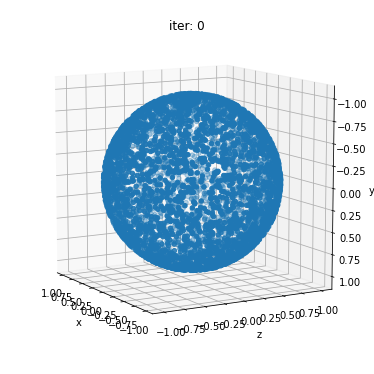

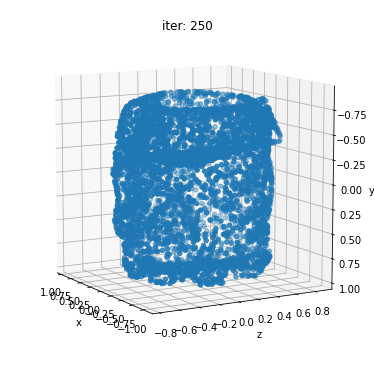

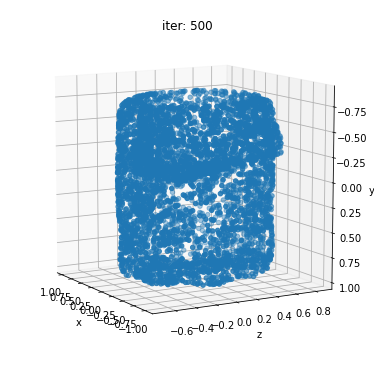

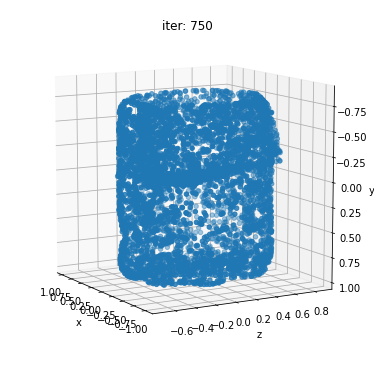

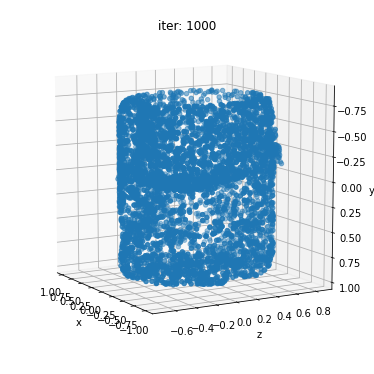

...

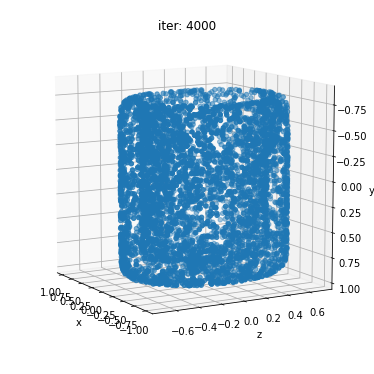

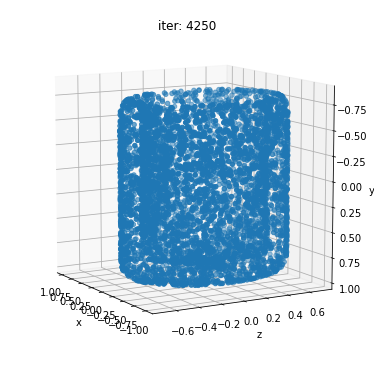

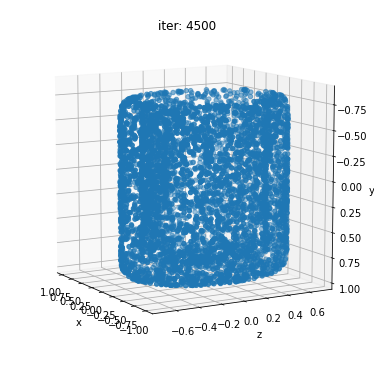

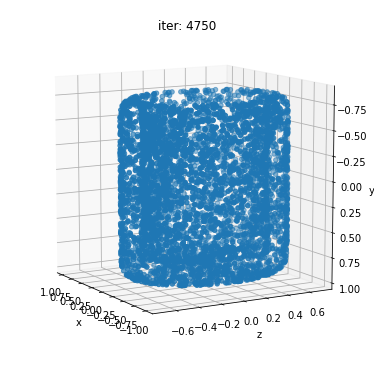

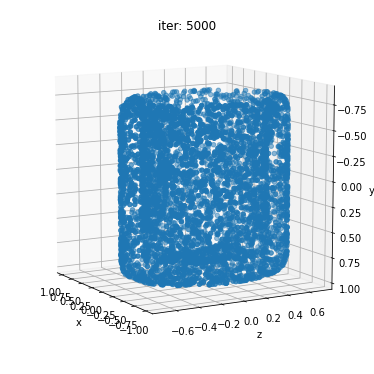

In [40]:
#3.2
ico_src_mesh = ico_sphere(4, device)
ret = deform_src_mesh_to_target(ico_src_mesh, mug_mesh)
SaveObjMesh(ret["new_mesh"], mug_center, mug_scale, "predicted_mug_3_2")

In [41]:
render2meshplotly(ret["new_mesh"], mug_mesh)

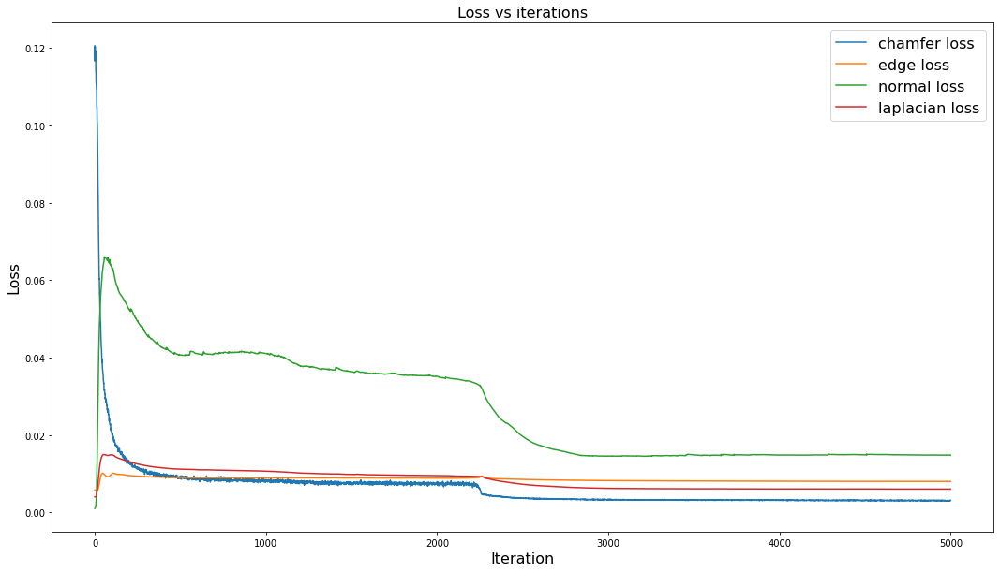

In [42]:
losses = {"chamfer loss": ret["chamfer_losses"], 
          "edge loss": ret["edge_losses"],
          "normal loss": ret["normal_losses"],
          "laplacian loss": ret["laplacian_losses"]}
plot_losses(losses, (18, 10))

In [43]:
#3.3
from pytorch3d.utils import torus
from mytorchutils import render2meshplotly
torus_src_mesh = torus(0.25, 0.75, 100, 100, device)
render2meshplotly(torus_src_mesh, mug_mesh)

optimizer SGD


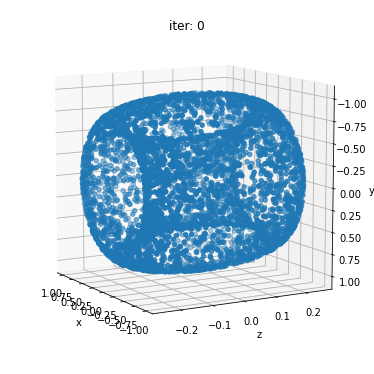

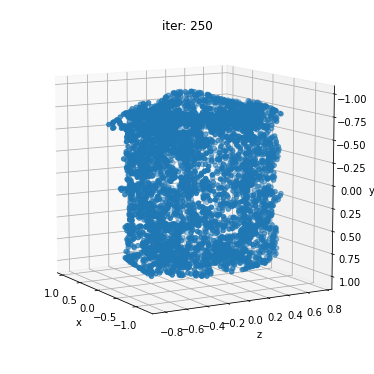

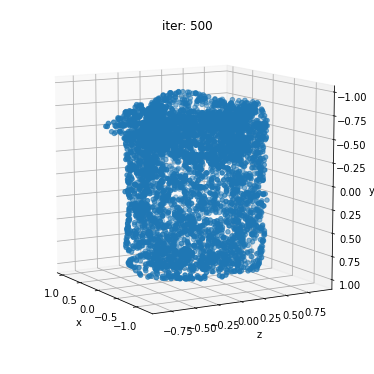

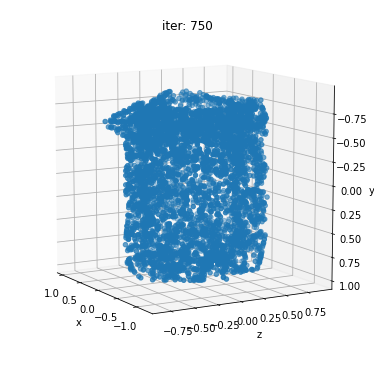

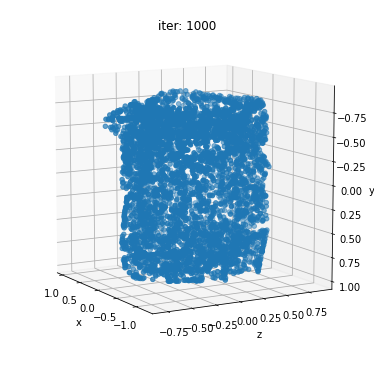

...

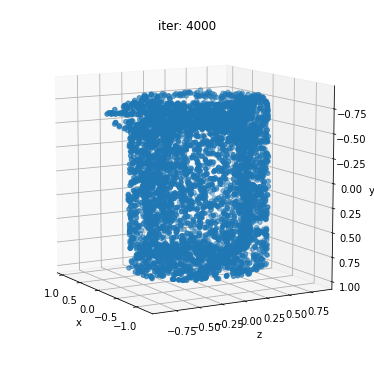

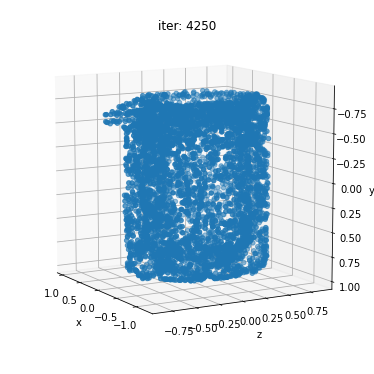

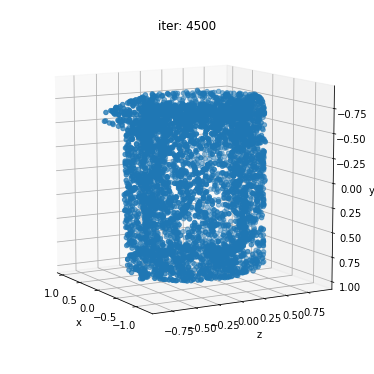

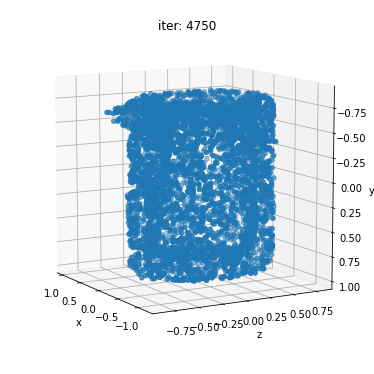

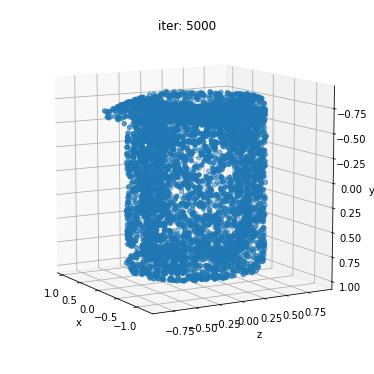

In [44]:
#3.3 #1
weights = {
  "w_chamfer"   : 1.00, 
  "w_edge"      : 1.00,
  "w_normal"    : 0.01, 
  "w_laplacian" : 0.10#,
#  "w_mesh_edge" : 0.00,
#  "w_mesh_face"
}
ret = deform_src_mesh_to_target(torus_src_mesh, mug_mesh, weights)
SaveObjMesh(ret["new_mesh"], mug_center, mug_scale, "predicted_mug_3_3")

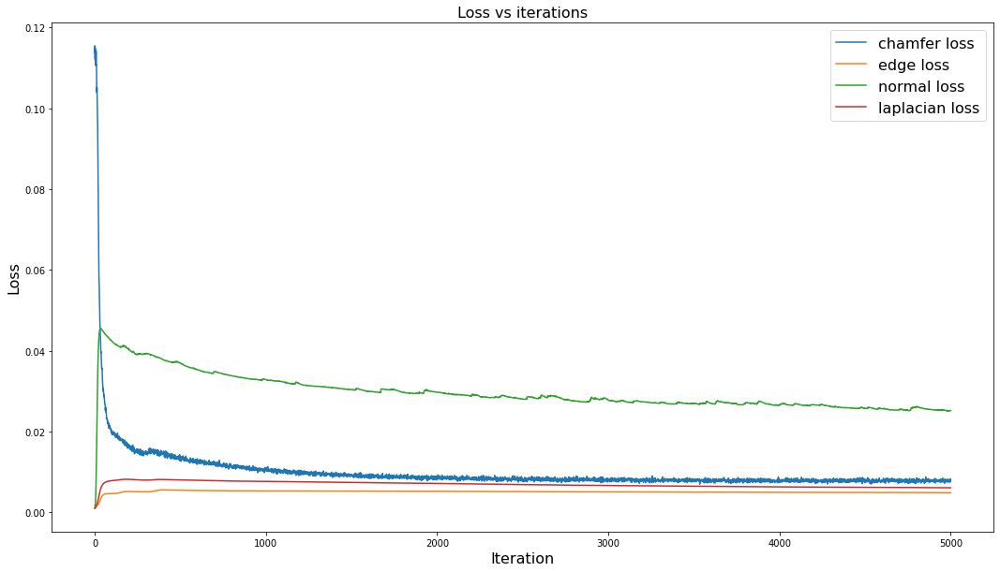

In [45]:
losses = {"chamfer loss": ret["chamfer_losses"], 
          "edge loss": ret["edge_losses"],
          "normal loss": ret["normal_losses"],
          "laplacian loss": ret["laplacian_losses"]}
plot_losses(losses, (18, 10))

optimizer SGD


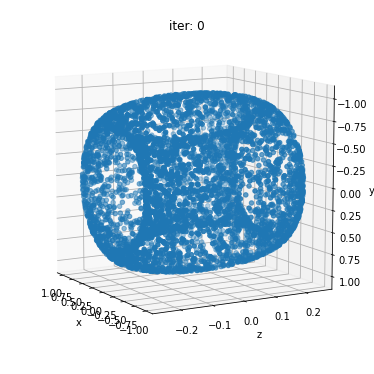

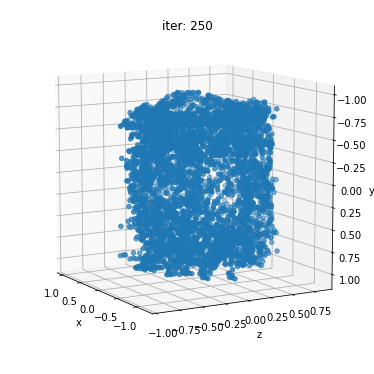

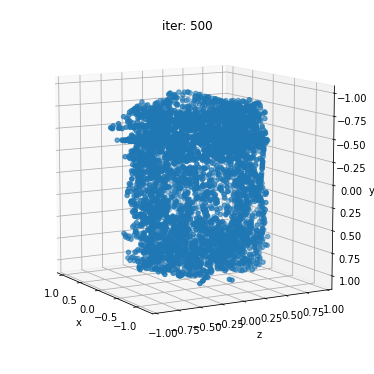

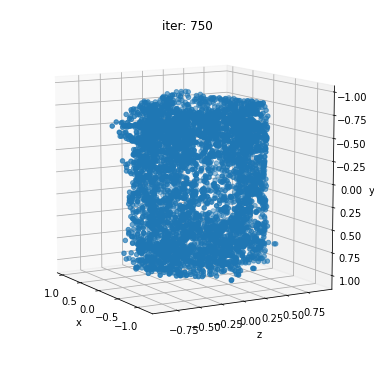

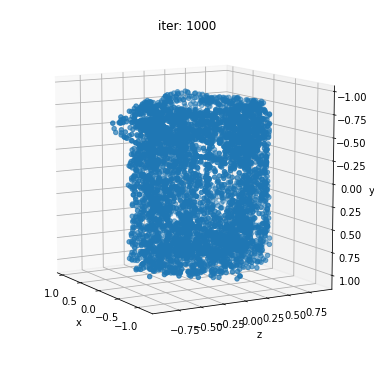

...

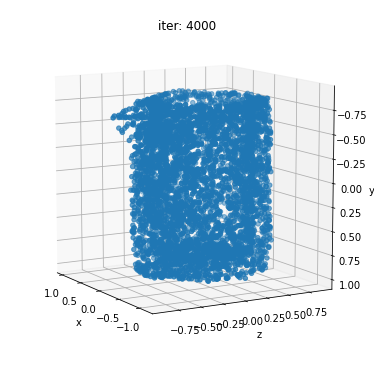

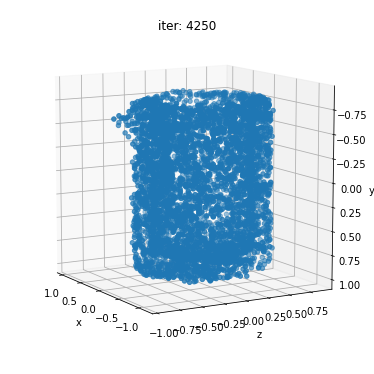

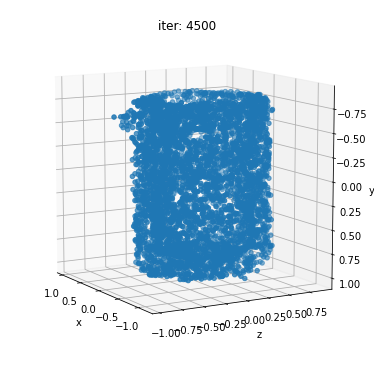

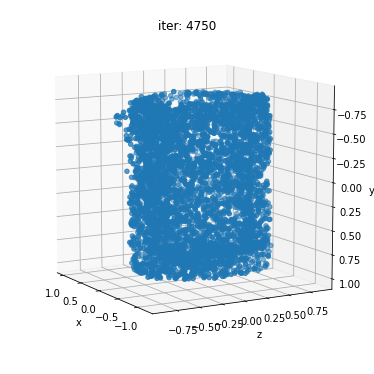

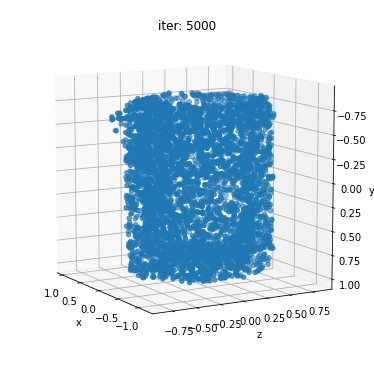

In [46]:
#3.3 #2
# Check only the position of vertices
weights = {
  "w_chamfer"   : 1.00, 
  "w_edge"      : 0.00,
  "w_normal"    : 0.00, 
  "w_laplacian" : 0.00#,
#  "w_mesh_edge" : 0.00,
#  "w_mesh_face"
}
ret = deform_src_mesh_to_target(torus_src_mesh, mug_mesh, weights)
SaveObjMesh(ret["new_mesh"], mug_center, mug_scale, "predicted_mug_3_3_vert_only")

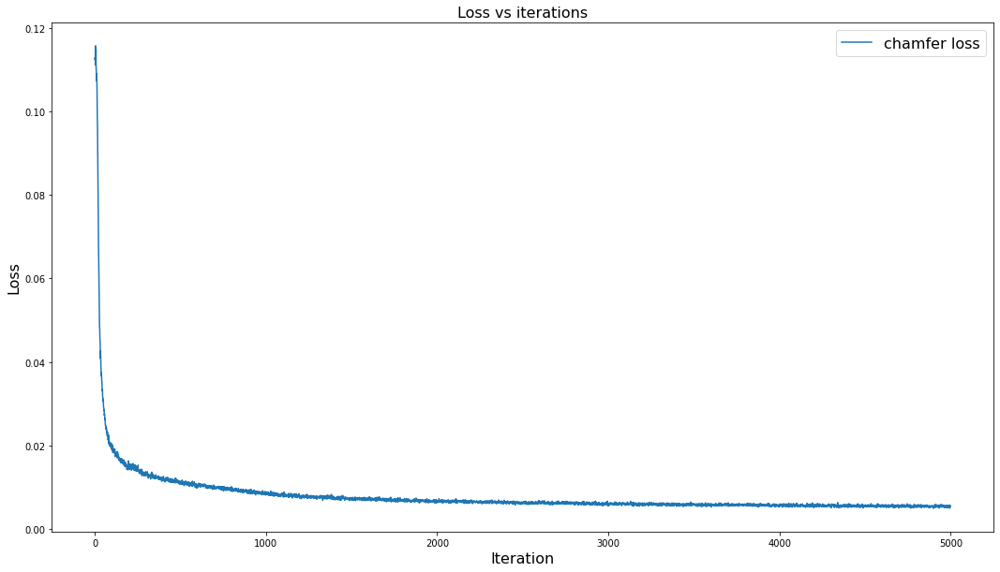

In [47]:
losses = {"chamfer loss": ret["chamfer_losses"]}
plot_losses(losses, (18, 10))

In [48]:
#E.2
from mytorchutils import rendermeshplotly, normalizeverts, loadandnormalizeobj
among_obj = os.path.join('/content/drive/MyDrive/s3d21/amongus.obj')

among_mesh, among_center, among_scale = loadandnormalizeobj(among_obj, device)
rendermeshplotly(among_mesh)

/usr/local/lib/python3.7/dist-packages/pytorch3d/io/obj_io.py:531: UserWarning:

Mtl file does not exist: /content/drive/MyDrive/s3d21/among us.mtl



optimizer SGD


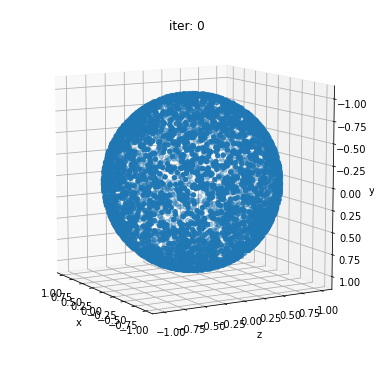

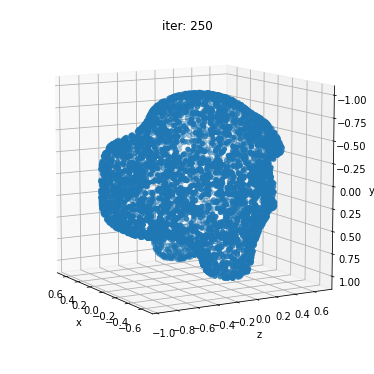

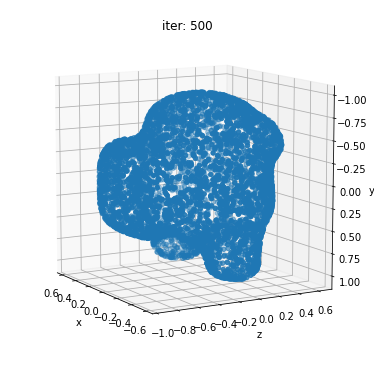

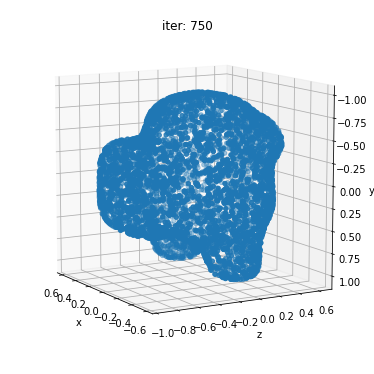

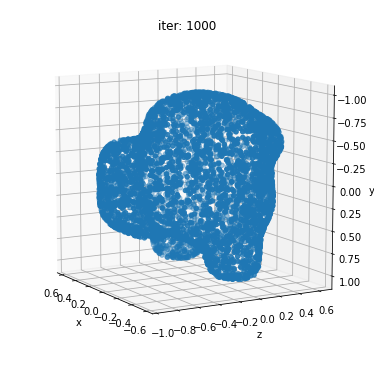

...

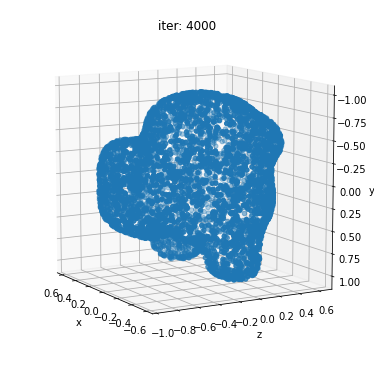

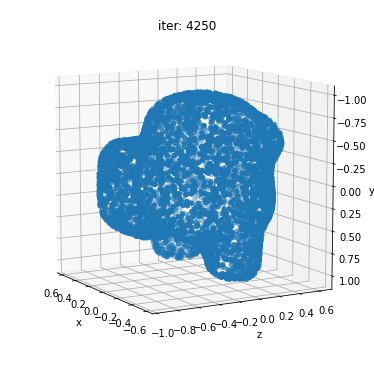

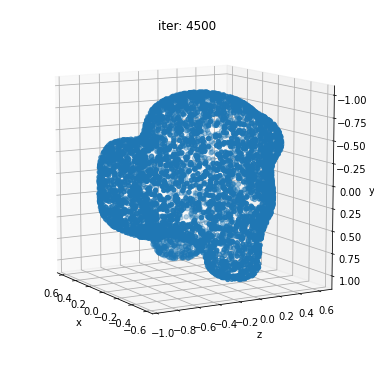

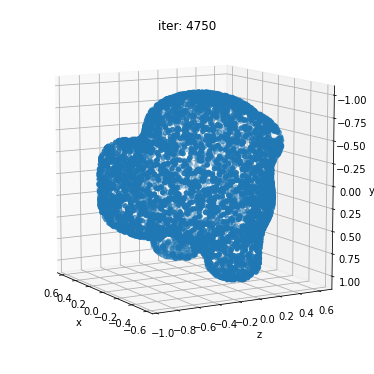

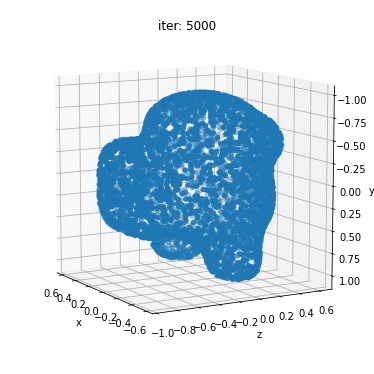

In [49]:
from pytorch3d.utils import ico_sphere
weights = {
  "w_chamfer"   : 1.00, 
  "w_edge"      : 1.00,
  "w_normal"    : 0.01, 
  "w_laplacian" : 0.10
}
ico_src_mesh = ico_sphere(4, device)
ret = deform_src_mesh_to_target(ico_src_mesh, among_mesh, weights, 5000, 1)
SaveObjMesh(ret["new_mesh"], among_center, among_scale, "predicted_among_us_e_2")